In [1]:
import torch
import torch.nn.functional as F
from torchmetrics.functional import structural_similarity_index_measure
from matplotlib import pyplot as plt

from datasets.data import DIV2K
from metrics import PSNR, SSIM

from utils import build_model

In [ ]:
data_dir = "F:\superRes\datasets\DIV2K"

valid_dataset = DIV2K(data_dir, split = 'valid')
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=32, shuffle=False)

./datasets/DIV2K\DIV2K_train_LR_bicubic\X4 already exists, skipping download and extraction.
./datasets/DIV2K\DIV2K_train_HR already exists, skipping download and extraction.


In [4]:
valid_dataset[0][0].shape, len(valid_dataset)

TypeError: Argument angle should be int or float

In [ ]:
from tqdm import tqdm

psnr = 0
ssim = 0

for i, (lr, hr) in enumerate(tqdm(valid_loader)):
    
    output = F.interpolate(lr, scale_factor=4, mode = 'bilinear')
    
    psnr += PSNR(output, hr)
    ssim += SSIM(output, hr)

print(f"PSNR: {psnr / len(valid_loader)}")
print(f"SSIM: {ssim / len(valid_loader)}")


    
    

  0%|          | 0/29 [00:00<?, ?it/s]c:\Users\Erik\anaconda3\envs\systoolchain\lib\site-packages\torchmetrics\utilities\prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(
 14%|█▍        | 4/29 [00:11<01:10,  2.80s/it]

In [6]:
from baseline.ESPCN import ESPCN, espcn_x4

model_espcn = espcn_x4(in_channels=3, out_channels=3, channels=64)
ckpt = torch.load(".\\logs\\ESPCN\\best_model.pth")
model_espcn.load_state_dict(ckpt['model'])
model_espcn.eval()

ESPCN(
  (feature_maps): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (1): Tanh()
    (2): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): Tanh()
  )
  (sub_pixel): Sequential(
    (0): Conv2d(32, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): PixelShuffle(upscale_factor=4)
  )
)

In [7]:
from baseline.SRCNN import SRCNN

model_srcnn = SRCNN()
model_srcnn.load_state_dict(torch.load("F:\SuperRes\checkpoint\SRCNN\SRCNN_3channel_psnr26.19.pth"))
model_srcnn.eval()


SRCNN(
  (conv1): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(4, 4))
  (conv2): Conv2d(64, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu): ReLU(inplace=True)
)

c:\Users\Erik\anaconda3\envs\systoolchain\lib\site-packages\torchmetrics\utilities\prints.py:70: FutureWarning: Importing `spectral_angle_mapper` from `torchmetrics.functional` was deprecated and will be removed in 2.0. Import `spectral_angle_mapper` from `torchmetrics.image` instead.
  _future_warning(


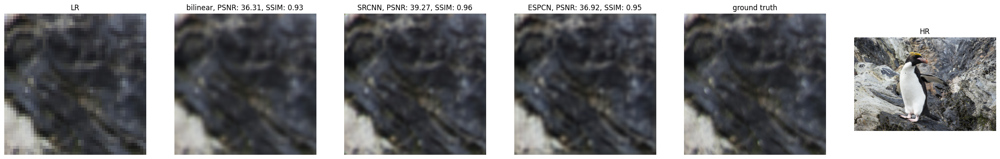

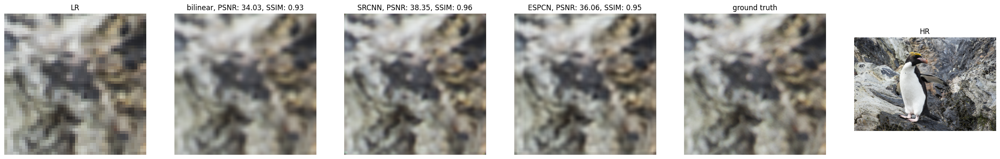

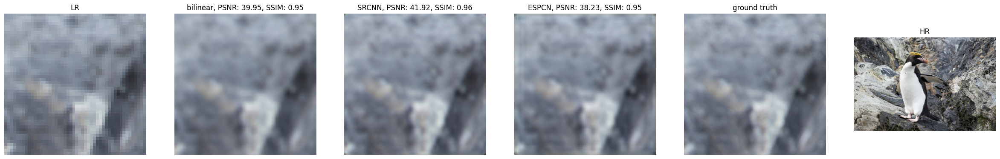

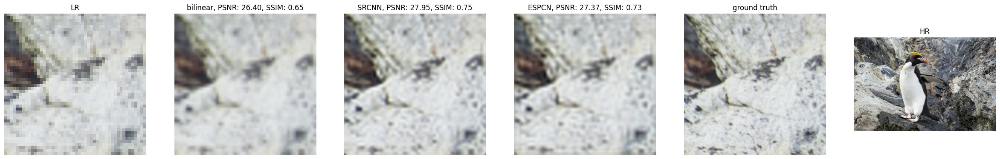

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


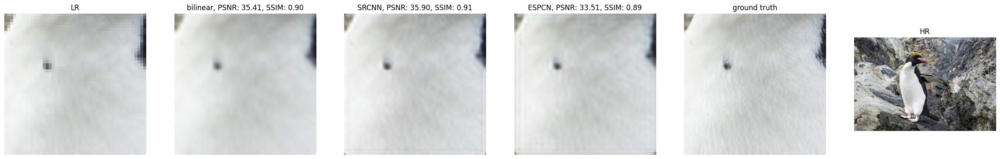

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


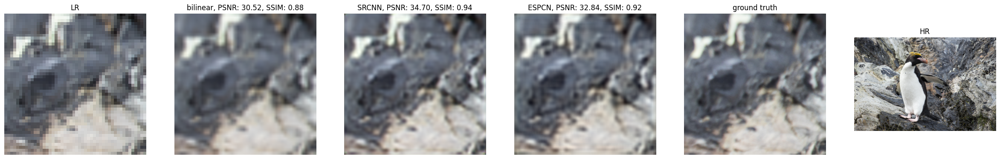

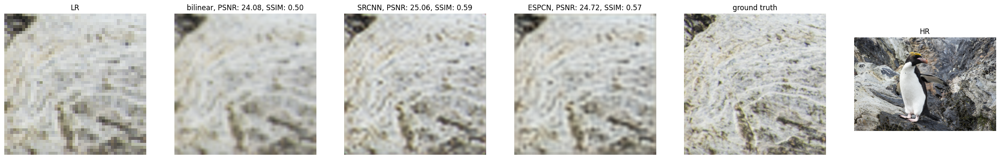

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


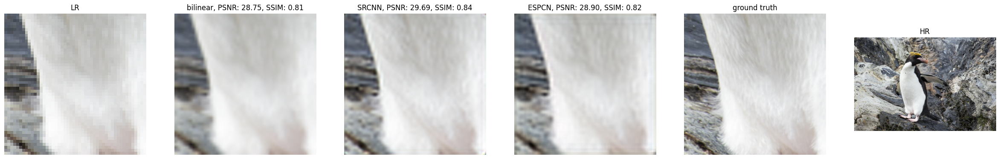

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


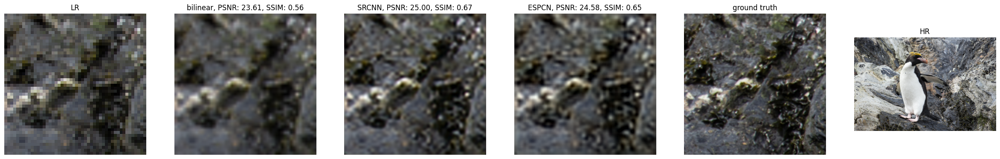

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


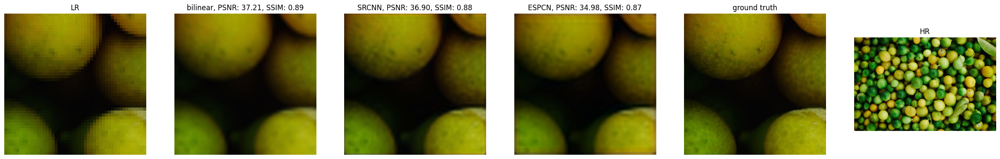

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


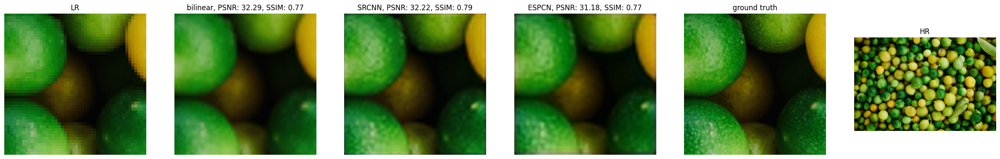

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


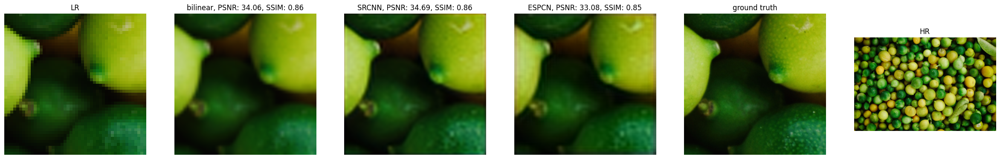

In [9]:
valid_dataset = DIV2K(data_dir, train=False, visualize=True)

for i, (lr_image_patched, hr_image_patched, lr_image, hr_image) in enumerate(valid_dataset):
    
    if i == 12:
        break
    lr_image_patched = lr_image_patched.unsqueeze(0)
    hr_image_patched = hr_image_patched.unsqueeze(0)
    output = F.interpolate(lr_image_patched, scale_factor=4, mode = 'bilinear')
    srcnn_output = model_srcnn(lr_image_patched).detach()
    espcn_output = model_espcn(lr_image_patched).detach()
    
    
    fig, axis = plt.subplots(1, 6, figsize=(30, 10))
    axis[0].imshow(lr_image_patched.squeeze(0).permute(1, 2, 0))
    axis[0].set_title("LR")
    axis[0].axis('off')

    axis[1].imshow(output.squeeze(0).permute(1, 2, 0))
    axis[1].set_title(f"bilinear, PSNR: {PSNR(output, hr_image_patched):.2f}, SSIM: {SSIM(output, hr_image_patched):.2f}")
    axis[1].axis('off')
    
    axis[2].imshow(srcnn_output.squeeze(0).permute(1, 2, 0))
    axis[2].set_title(f"SRCNN, PSNR: {PSNR(srcnn_output, hr_image_patched):.2f}, SSIM: {SSIM(srcnn_output, hr_image_patched):.2f}")
    axis[2].axis('off')
    
    axis[3].imshow(espcn_output.squeeze(0).permute(1, 2, 0))
    axis[3].set_title(f"ESPCN, PSNR: {PSNR(espcn_output, hr_image_patched):.2f}, SSIM: {SSIM(espcn_output, hr_image_patched):.2f}")
    axis[3].axis('off')
    
    axis[4].imshow(hr_image_patched.squeeze(0).permute(1, 2, 0))
    axis[4].set_title("ground truth")
    axis[4].axis('off')
    
    axis[5].imshow(hr_image.permute(1, 2, 0))
    axis[5].set_title("HR")
    axis[5].title_size = 30
    axis[5].axis('off')
    
    plt.show()
    
    
    
    
    